In [68]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [69]:
df=pd.read_csv('diamonds.csv')

In [70]:
df.head()

,Unnamed: 0,carat,cut,color,clarity,depth,table,price,x,y,z
0,1,0.23,Ideal,E,SI2,61.5,55.0,326,3.95,3.98,2.43
1,2,0.21,Premium,E,SI1,59.8,61.0,326,3.89,3.84,2.31
2,3,0.23,Good,E,VS1,56.9,65.0,327,4.05,4.07,2.31
3,4,0.29,Premium,I,VS2,62.4,58.0,334,4.20,4.23,2.63
4,5,0.31,Good,J,SI2,63.3,58.0,335,4.34,4.35,2.75


In [71]:
df.shape

(53940, 11)

In [72]:
df.drop('Unnamed: 0',axis=1,inplace=True)

In [73]:
df.head()

,carat,cut,color,clarity,depth,table,price,x,y,z
0,0.23,Ideal,E,SI2,61.5,55.0,326,3.95,3.98,2.43
1,0.21,Premium,E,SI1,59.8,61.0,326,3.89,3.84,2.31
2,0.23,Good,E,VS1,56.9,65.0,327,4.05,4.07,2.31
3,0.29,Premium,I,VS2,62.4,58.0,334,4.20,4.23,2.63
4,0.31,Good,J,SI2,63.3,58.0,335,4.34,4.35,2.75


In [74]:
df['cut'].value_counts()

Ideal        21551
Premium      13791
Very Good    12082
Good          4906
Fair          1610
Name: cut, dtype: int64

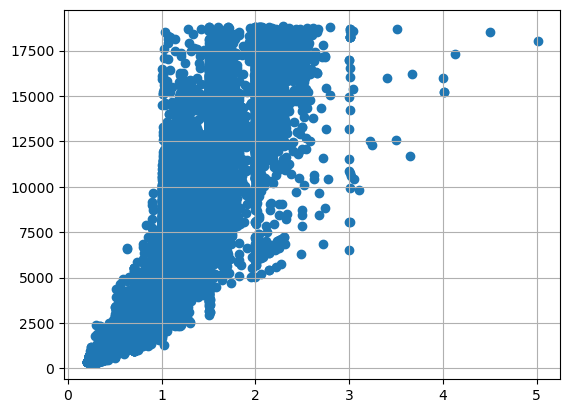

In [75]:
plt.grid(True)
plt.scatter(data=df,x='carat',y='price')

<AxesSubplot:xlabel='carat', ylabel='price'>

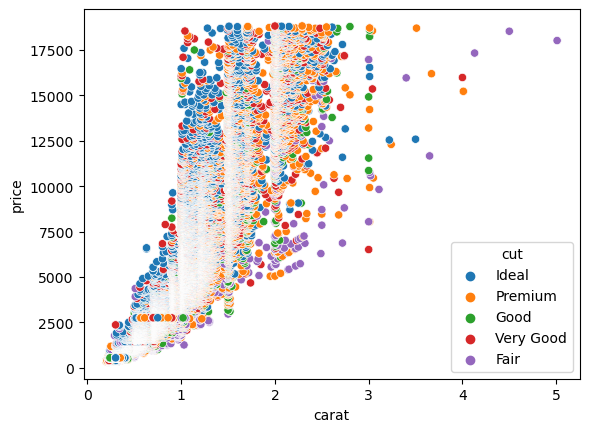

In [76]:
sns.scatterplot(data=df,x='carat',y='price',hue='cut')

In [77]:
import plotly.express as px
import plotly.graph_objects as go
px.scatter(data_frame = df, x="carat",
                    y="price", size="depth", 
                    color= "cut", trendline="ols")

In [78]:
df['size']=df['x']*df['y']*df['z']

In [79]:
df.head()

,carat,cut,color,clarity,depth,table,price,x,y,z,size
0,0.23,Ideal,E,SI2,61.5,55.0,326,3.95,3.98,2.43,38.202030
1,0.21,Premium,E,SI1,59.8,61.0,326,3.89,3.84,2.31,34.505856
2,0.23,Good,E,VS1,56.9,65.0,327,4.05,4.07,2.31,38.076885
3,0.29,Premium,I,VS2,62.4,58.0,334,4.20,4.23,2.63,46.724580
4,0.31,Good,J,SI2,63.3,58.0,335,4.34,4.35,2.75,51.917250


<AxesSubplot:xlabel='size', ylabel='price'>

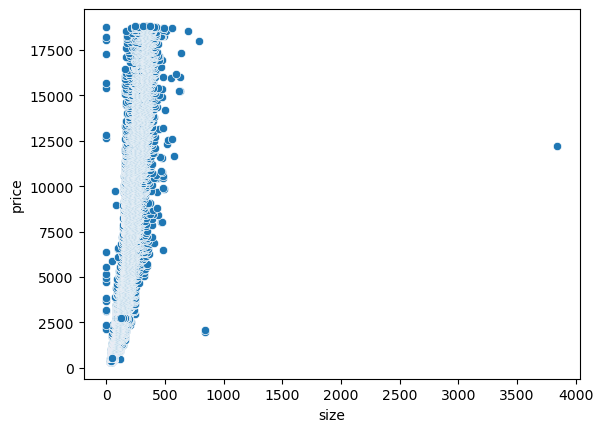

In [80]:
sns.scatterplot(data=df,x='size',y='price')

In [81]:
px.scatter(data_frame = df, x="size",
                    y="price", size="size", 
                    color= "cut", trendline="ols")

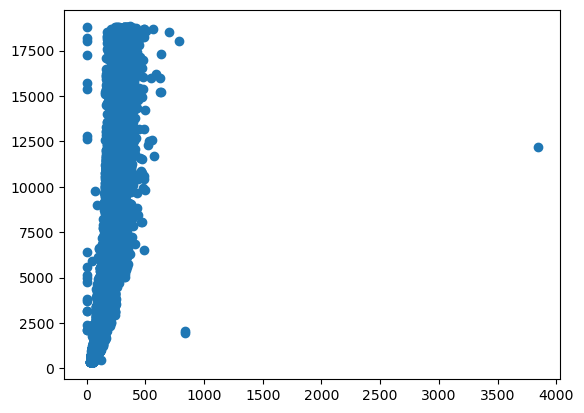

In [82]:
plt.scatter(data=df,x='size',y='price')

<AxesSubplot:xlabel='color', ylabel='price'>

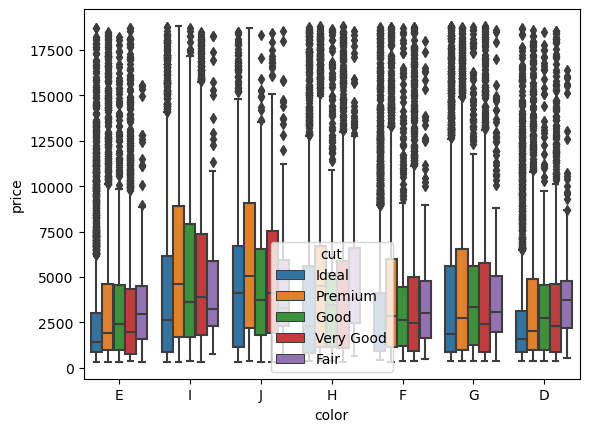

In [83]:
sns.boxplot(data=df,x='color',y='price',hue='cut')

In [84]:
px.box(df, x="cut", 
             y="price", 
             color="color")

<AxesSubplot:xlabel='cut', ylabel='price'>

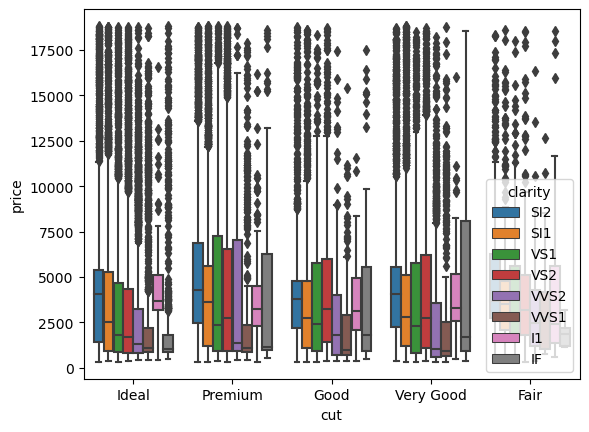

In [85]:
sns.boxplot(data=df,x='cut',y='price',hue='clarity')

<AxesSubplot:>

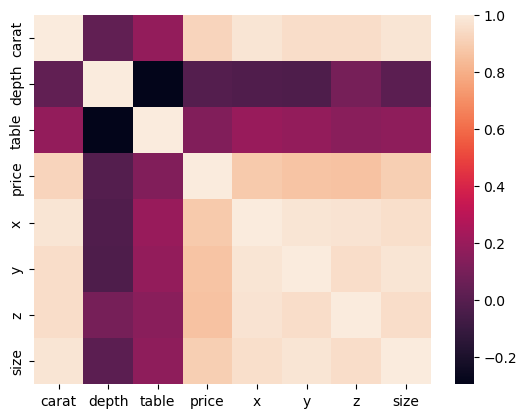

In [86]:
sns.heatmap(df.corr())

In [87]:
cor=df.corr()

In [88]:
cor['price'].sort_values(ascending=False)

price    1.000000
carat    0.921591
size     0.902385
x        0.884435
y        0.865421
z        0.861249
table    0.127134
depth   -0.010647
Name: price, dtype: float64

In [89]:
df['cut'].value_counts()

Ideal        21551
Premium      13791
Very Good    12082
Good          4906
Fair          1610
Name: cut, dtype: int64

In [90]:
df["cut"] = df["cut"].map({"Ideal": 1, 
                               "Premium": 2, 
                               "Good": 3,
                               "Very Good": 4,
                               "Fair": 5})

In [91]:
df.head()

,carat,cut,color,clarity,depth,table,price,x,y,z,size
0,0.23,1,E,SI2,61.5,55.0,326,3.95,3.98,2.43,38.202030
1,0.21,2,E,SI1,59.8,61.0,326,3.89,3.84,2.31,34.505856
2,0.23,3,E,VS1,56.9,65.0,327,4.05,4.07,2.31,38.076885
3,0.29,2,I,VS2,62.4,58.0,334,4.20,4.23,2.63,46.724580
4,0.31,3,J,SI2,63.3,58.0,335,4.34,4.35,2.75,51.917250


In [93]:
from sklearn.model_selection import train_test_split

In [92]:
x=df[['carat','cut','size']]
y=df['price']

In [94]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.10,random_state=42)

In [95]:
from sklearn.ensemble import RandomForestRegressor

In [96]:
model=RandomForestRegressor()

In [97]:
model.fit(x_train,y_train)

RandomForestRegressor()

In [98]:
print("Diamond Price Prediction")
a = float(input("Carat Size: "))
b = int(input("Cut Type (Ideal: 1, Premium: 2, Good: 3, Very Good: 4, Fair: 5): "))
c = float(input("Size: "))
features = np.array([[a, b, c]])
print("Predicted Diamond's Price = ", model.predict(features))

Diamond Price Prediction
Carat Size: 0.60
Cut Type (Ideal: 1, Premium: 2, Good: 3, Very Good: 4, Fair: 5): 2
Size: 40
Predicted Diamond's Price =  [911.47333333]


C:\Users\HP\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning:

X does not have valid feature names, but RandomForestRegressor was fitted with feature names

